### **Loading Libraries**

In [0]:
import os

# Change this path to a DBFS mount or a persistent volume in your workspace
os.environ['SPARKML_TEMP_DFS_PATH'] = '/dbfs/tmp/sparkml_temp'


In [0]:
import os
os.environ["SPARKML_TEMP_DFS_PATH"] = "/Volumes/workspace/default/ml_tmp"

In [0]:
from pyspark.sql import SparkSession
from pyspark.sql.functions import *
from pyspark.sql.types import *
from pyspark.sql.functions import col, when, isnan, count, udf

In [0]:
df = spark.table("default.metro_interstate_traffic_volume")
display(df.limit(10))

holiday,temp,rain_1h,snow_1h,clouds_all,weather_main,weather_description,date_time,traffic_volume
None,288.28,0.0,0.0,40,Clouds,scattered clouds,2012-10-02T09:00:00.000Z,5545
None,289.36,0.0,0.0,75,Clouds,broken clouds,2012-10-02T10:00:00.000Z,4516
None,289.58,0.0,0.0,90,Clouds,overcast clouds,2012-10-02T11:00:00.000Z,4767
None,290.13,0.0,0.0,90,Clouds,overcast clouds,2012-10-02T12:00:00.000Z,5026
None,291.14,0.0,0.0,75,Clouds,broken clouds,2012-10-02T13:00:00.000Z,4918
None,291.72,0.0,0.0,1,Clear,sky is clear,2012-10-02T14:00:00.000Z,5181
None,293.17,0.0,0.0,1,Clear,sky is clear,2012-10-02T15:00:00.000Z,5584
None,293.86,0.0,0.0,1,Clear,sky is clear,2012-10-02T16:00:00.000Z,6015
None,294.14,0.0,0.0,20,Clouds,few clouds,2012-10-02T17:00:00.000Z,5791
None,293.1,0.0,0.0,20,Clouds,few clouds,2012-10-02T18:00:00.000Z,4770


### **Check Missing Values**

In [0]:
missing = df.select([
    sum(when(col(c).isNull(), 1).otherwise(0)).alias(c)
    for c in df.columns
])
display(missing)

holiday,temp,rain_1h,snow_1h,clouds_all,weather_main,weather_description,date_time,traffic_volume
0,0,0,0,0,0,0,0,0


### **Check schema**

In [0]:
df.printSchema()

root
 |-- holiday: string (nullable = true)
 |-- temp: double (nullable = true)
 |-- rain_1h: double (nullable = true)
 |-- snow_1h: double (nullable = true)
 |-- clouds_all: long (nullable = true)
 |-- weather_main: string (nullable = true)
 |-- weather_description: string (nullable = true)
 |-- date_time: timestamp (nullable = true)
 |-- traffic_volume: long (nullable = true)



#### Unique Values in Categorical Columns

In [0]:
categorical_cols = ["holiday", "weather_main", "weather_description"]

for c in categorical_cols:
    print(f"--- {c} ---")
    uniques = [row[0] for row in df.select(c).distinct().collect()]
    print(uniques)
    print("\n")

--- holiday ---
['None', 'Columbus Day', 'Veterans Day', 'Thanksgiving Day', 'Christmas Day', 'New Years Day', 'Washingtons Birthday', 'Memorial Day', 'Independence Day', 'State Fair', 'Labor Day', 'Martin Luther King Jr Day']


--- weather_main ---
['Clouds', 'Clear', 'Rain', 'Drizzle', 'Mist', 'Haze', 'Fog', 'Thunderstorm', 'Snow', 'Squall', 'Smoke']


--- weather_description ---
['scattered clouds', 'broken clouds', 'overcast clouds', 'sky is clear', 'few clouds', 'light rain', 'light intensity drizzle', 'mist', 'haze', 'fog', 'proximity shower rain', 'drizzle', 'moderate rain', 'heavy intensity rain', 'proximity thunderstorm', 'thunderstorm with light rain', 'proximity thunderstorm with rain', 'heavy snow', 'heavy intensity drizzle', 'snow', 'thunderstorm with heavy rain', 'freezing rain', 'shower snow', 'light rain and snow', 'light intensity shower rain', 'SQUALLS', 'thunderstorm with rain', 'proximity thunderstorm with drizzle', 'thunderstorm', 'Sky is Clear', 'very heavy rain',

### **Feature Engineering**

In [0]:
# Drop weather_description
df = df.drop("weather_description")

- Dropping this column does not cause loss of important information, as the weather_main column sufficiently represents the weather conditions for predicting traffic volume.

**Extracting Feature from date_time**

In [0]:
#Extract features from date_time:
from pyspark.sql.functions import hour, dayofweek, month
df = df.withColumn("hour", hour("date_time"))
df = df.withColumn("day_of_week", dayofweek("date_time"))
df = df.withColumn("month", month("date_time"))

**Creating a new column 'is_holiday': 1 if it is a holiday, 0 if 'None'**

In [0]:
# Create a new column 'is_holiday': 1 if it is a holiday, 0 if 'None'
df = df.withColumn(
    "is_holiday",
    when(col("holiday") != "None", 1).otherwise(0)
)

#drop the original 'holiday' column
df = df.drop("holiday")

display(df.select("is_holiday").limit(127))


is_holiday
0
0
0
0
0
0
0
0
0
0


| weather_main | weather_index |
| ------------ | ------------- |
| Clouds       | 1             |
| Clear        | 2            |
| Rain         | 3            |
| Drizzle      | 4            |
| Mist         | 5             |
| Haze         | 6             |
| Fog          | 7             |
| Thunderstorm | 8             |
| Snow         | 9             |
| Squall       | 10             |
| Smoke        | 11           |


**Weather_main to numeric values**

In [0]:
# Map weather_main to numeric values
df = df.withColumn(
    "weather_index",
    when(col("weather_main") == "Clouds", 1)
    .when(col("weather_main") == "Clear", 2)
    .when(col("weather_main") == "Rain", 3)
    .when(col("weather_main") == "Drizzle", 4)
    .when(col("weather_main") == "Mist", 5)
    .when(col("weather_main") == "Haze", 6)
    .when(col("weather_main") == "Fog", 7)
    .when(col("weather_main") == "Thunderstorm", 8)
    .when(col("weather_main") == "Snow", 9)
    .when(col("weather_main") == "Squall", 10)
    .when(col("weather_main") == "Smoke", 11)
    .otherwise(-1)  # For any unexpected values
)

display(df.select("weather_main", "weather_index").limit(10))


weather_main,weather_index
Clouds,1
Clouds,1
Clouds,1
Clouds,1
Clouds,1
Clear,2
Clear,2
Clear,2
Clouds,1
Clouds,1


Databricks visualization. Run in Databricks to view.

**Select features and label**

**Target**
- label_col = "traffic_volume"

**Features**
- feature_cols = ["is_holiday", "weather_index", "temp", "rain_1h", "snow_1h", 
                "clouds_all", "hour", "day_of_week", "month"]


### Exploratory Data Analysis (EDA)

In [0]:
# Showing first few rows
feature_cols = ["is_holiday", "weather_index", "temp", "rain_1h", "snow_1h", "clouds_all", "hour", "day_of_week", "month"]
display(df.select("traffic_volume", *feature_cols).limit(10))

traffic_volume,is_holiday,weather_index,temp,rain_1h,snow_1h,clouds_all,hour,day_of_week,month
5545,0,1,288.28,0.0,0.0,40,9,3,10
4516,0,1,289.36,0.0,0.0,75,10,3,10
4767,0,1,289.58,0.0,0.0,90,11,3,10
5026,0,1,290.13,0.0,0.0,90,12,3,10
4918,0,1,291.14,0.0,0.0,75,13,3,10
5181,0,2,291.72,0.0,0.0,1,14,3,10
5584,0,2,293.17,0.0,0.0,1,15,3,10
6015,0,2,293.86,0.0,0.0,1,16,3,10
5791,0,1,294.14,0.0,0.0,20,17,3,10
4770,0,1,293.1,0.0,0.0,20,18,3,10


In [0]:
summary_df = df.select("traffic_volume", *feature_cols).describe()
display(summary_df)

summary,traffic_volume,is_holiday,weather_index,temp,rain_1h,snow_1h,clouds_all,hour,day_of_week,month
count,48204,48204,48204,48204,48204,48204,48204,48204,48204,48204
mean,3259.8183553232097,0.0012654551489502946,3.0071363372334248,281.2058703012135,0.33426396149697535,2.2238818355323212E-4,49.36223135009543,11.398161978259065,3.98705501618123,6.506036843415484
stddev,1986.860670446337,0.03555108987945374,2.310644356377471,13.338231912676335,44.78913303693666,0.008167611205361632,39.01575046141366,6.940237742785154,1.9989724261568966,3.400221370516305
min,0,0,1,0.0,0.0,0.0,0,0,1,1
max,7280,1,11,310.07,9831.3,0.51,100,23,7,12


#### Check Categorical Features

In [0]:
display(
    df.groupBy("is_holiday")
      .count()
)


is_holiday,count
0,48143
1,61


Databricks visualization. Run in Databricks to view.

**Observation**
- Holiday (is_holiday): Almost all the days are non-holidays (48,143), and only a very few are holidays (61). So, holidays are rare in this dataset.

In [0]:
display(
    df.groupBy("weather_index")
      .count()
      .orderBy("weather_index")
)


weather_index,count
1,15164
2,13391
3,5672
4,1821
5,5950
6,1360
7,912
8,1034
9,2876
10,4


Databricks visualization. Run in Databricks to view.

**Observation**
- Weather (weather_index): Most of the data is cloudy (1: 15,164) or clear (2: 13,391). Rainy (3: 5,672) and misty (5: 5,950) days are less frequent. Extreme weather like squall (10: 4) or smoke (11: 20) is very rare.

#### Distribution of Traffic Volume
- approxQuantile is a way to quickly find the “cut points” (quantiles) of a column in a big dataset.

In [0]:
# Histogram using approxQuantile for binning
# Histogram using approxQuantile for binning
traffic_stats = df.approxQuantile("traffic_volume", [0.25, 0.5, 0.75], 0.01)

q25, q50, q75 = traffic_stats

print(f"25th Percentile: {q25}")
print(f"Median (50th Percentile): {q50}")
print(f"75th Percentile: {q75}")



25th Percentile: 1159.0
Median (50th Percentile): 3341.0
75th Percentile: 4928.0


In [0]:
display(df.select("traffic_volume"))

traffic_volume
5545
4516
4767
5026
4918
5181
5584
6015
5791
4770


Databricks visualization. Run in Databricks to view.

In [0]:
q1, q2, q3 = traffic_stats

df = df.withColumn(
    "traffic_bin",
    when(col("traffic_volume") <= q1, "Low")
    .when(col("traffic_volume") <= q2, "Medium")
    .when(col("traffic_volume") <= q3, "High")
    .otherwise("Very High")
)

display(df.groupBy("traffic_bin").count())

traffic_bin,count
Very High,12112
High,12216
Medium,11997
Low,11879


Databricks visualization. Run in Databricks to view.

#### Convert traffic_bin to numeric

In [0]:
df = df.withColumn(
    "traffic_bin_index",
    when(col("traffic_bin") == "Low", 1)
    .when(col("traffic_bin") == "Medium", 2)
    .when(col("traffic_bin") == "High", 3)
    .otherwise(4)
)

In [0]:
from pyspark.sql.functions import floor, col

# Create bins
df_hist = df.withColumn(
    "traffic_bin",
    floor(col("traffic_volume") / 100) * 100
)

display(
    df_hist.groupBy("traffic_bin")
           .count()
           .orderBy("traffic_bin")
)


traffic_bin,count
0,60
100,36
200,1153
300,3110
400,1422
500,1048
600,997
700,1019
800,1317
900,824


Databricks visualization. Run in Databricks to view.

**Observation**
The distribution is clearly bimodal, with two dominant traffic patterns. A sharp spike at low volumes (around 0–1,000 vehicles) indicates frequent low-traffic periods, likely during late-night or early-morning hours. A second, broader peak appears between roughly 4,000 and 5,500 vehicles, representing regular high-traffic periods such as daytime or commute hours.

Traffic volume gradually tapers after 6,000 vehicles, showing that extremely heavy traffic is less common but still present. Overall, the data covers a wide range of conditions from very light to very heavy traffic.

To simplify analysis, traffic volume was divided into four quartile-based bins: Low, Medium, High, and Very High. Each bin contains a similar number of observations, confirming that the dataset is well-balanced across different traffic levels and suitable for building reliable prediction models.


Why approxQuantile instead of histogram?
- Spark does not have a native histogram for DataFrames; approxQuantile provides scalable distribution insight.

### Time-based Patterns
- Traffic usually depends on hour of day, day of week, and month.

In [0]:
display(df.limit(5))

temp,rain_1h,snow_1h,clouds_all,weather_main,date_time,traffic_volume,hour,day_of_week,month,is_holiday,weather_index,traffic_bin,traffic_bin_index
288.28,0.0,0.0,40,Clouds,2012-10-02T09:00:00.000Z,5545,9,3,10,0,1,Very High,4
289.36,0.0,0.0,75,Clouds,2012-10-02T10:00:00.000Z,4516,10,3,10,0,1,High,3
289.58,0.0,0.0,90,Clouds,2012-10-02T11:00:00.000Z,4767,11,3,10,0,1,High,3
290.13,0.0,0.0,90,Clouds,2012-10-02T12:00:00.000Z,5026,12,3,10,0,1,Very High,4
291.14,0.0,0.0,75,Clouds,2012-10-02T13:00:00.000Z,4918,13,3,10,0,1,High,3


In [0]:
# Average traffic per hour
display(
    df.groupBy("hour")
      .avg("traffic_volume")
      .orderBy("hour")
)

hour,avg(traffic_volume)
0,834.7810505645557
1,516.448999511957
2,388.35364041604754
3,371.0908641975309
4,702.5518890483022
5,2094.573436742608
6,4140.503593675132
7,4740.181337181337
8,4587.497115384615
9,4385.277502477701


Databricks visualization. Run in Databricks to view.

In [0]:
# Average traffic per day of week
display(
    df.groupBy("day_of_week")
      .avg("traffic_volume")
      .orderBy("day_of_week")
)

day_of_week,avg(traffic_volume)
1,2368.588329452852
2,3309.387160633484
3,3488.555799006719
4,3583.196681096681
5,3637.8996626081853
6,3656.3588355763604
7,2773.6381203337723


Databricks visualization. Run in Databricks to view.

In [0]:
# Average traffic per month
display(
    df.groupBy("month")
      .avg("traffic_volume")
      .orderBy("month")
)

month,avg(traffic_volume)
1,3051.0813779331
2,3197.9455473624503
3,3308.3886105984707
4,3304.37238788448
5,3366.319431920649
6,3419.0774125132557
7,3205.4817518248174
8,3394.2418912745547
9,3303.049334377447
10,3390.678376043766


Databricks visualization. Run in Databricks to view.

**Observation**

**By Hour:** Traffic is very low during late night and early morning (0–4 AM), starts increasing around 5 AM, peaks between 4–5 PM, and then gradually decreases in the evening.

**By Day of Week:** Traffic is lowest on Sundays, increases during weekdays, and is highest on Fridays and Saturdays.

**By Month:** Traffic is fairly consistent throughout the year, with slightly higher volumes in the summer months (May–August) and slightly lower in winter (January and December).

#### Correlation Between Features and Traffic

In [0]:
numeric_cols = ["temp", "rain_1h", "snow_1h", "clouds_all", "hour", "day_of_week", "month", "is_holiday"]

for col_name in numeric_cols:
    corr = df.stat.corr(col_name, "traffic_volume")
    print(f"Correlation between {col_name} and traffic_volume: {corr}")


Correlation between temp and traffic_volume: 0.13029879817112527
Correlation between rain_1h and traffic_volume: 0.004713702367859265
Correlation between snow_1h and traffic_volume: 0.0007334345358283826
Correlation between clouds_all and traffic_volume: 0.06705377704283516
Correlation between hour and traffic_volume: 0.3524007985606101
Correlation between day_of_week and traffic_volume: 0.07386984277207352
Correlation between month and traffic_volume: -0.0025329179061071515
Correlation between is_holiday and traffic_volume: -0.04289708057428103


In [0]:
from pyspark.sql import Row

corr_rows = [
    Row(feature=col_name, correlation=df.stat.corr(col_name, "traffic_volume"))
    for col_name in numeric_cols
]

corr_df = spark.createDataFrame(corr_rows)

display(corr_df.orderBy("correlation", ascending=False))


feature,correlation
hour,0.3524007985606101
temp,0.13029879817112527
day_of_week,0.07386984277207352
clouds_all,0.06705377704283516
rain_1h,0.004713702367859265
snow_1h,7.334345358283826E-4
month,-0.0025329179061071515
is_holiday,-0.04289708057428103


Databricks visualization. Run in Databricks to view.

**Observation**
- Hour has the strongest relationship with traffic volume (0.35). This makes sense because traffic changes a lot depending on the time of day (rush hours).
- Temperature shows a small positive correlation (0.13). Warmer days may have slightly more traffic.
- clouds_all and day_of_week have very weak correlations, meaning clouds or the day of the week do not strongly affect traffic.
- Rain, snow, and month have almost zero correlation, so weather intensity or the month of the year does not influence traffic much in this dataset.
- Holidays have a small negative correlation (-0.04), meaning traffic is slightly lower on holidays, but the effect is very small.
- Traffic volume is mainly affected by time of day, while weather and holidays have very little impact in this dataset.

#### Train/Test Split

In [0]:
train_df, test_df = df.randomSplit([0.8, 0.2], seed=42)

print("Training rows:", train_df.count())
print("Testing rows:", test_df.count())

Training rows: 38496
Testing rows: 9708


#### Select Label & Feature Columns


In [0]:
label_col = "traffic_volume"

feature_cols = [
    "is_holiday", "weather_index", "temp", "rain_1h", "snow_1h",
    "clouds_all", "hour", "day_of_week", "month"
]



#### VectorAssembler

In [0]:
from pyspark.ml.feature import VectorAssembler

assembler = VectorAssembler(
    inputCols=feature_cols,
    outputCol="features"
)

#### Random Forest Regressor

In [0]:
from pyspark.ml.regression import RandomForestRegressor

rf = RandomForestRegressor(
    featuresCol="features",
    labelCol=label_col,
    predictionCol="rf_prediction",
    numTrees=100,
    maxDepth=10,
    seed=42
)


#### Gradient Boosted Trees Regressor

In [0]:
from pyspark.ml.regression import GBTRegressor

gbt = GBTRegressor(
    featuresCol="features",
    labelCol=label_col,
    predictionCol="gbt_prediction",
    maxIter=50,
    maxDepth=5,
    seed=42
)


#### Build Pipelines

In [0]:
from pyspark.ml import Pipeline

rf_pipeline = Pipeline(stages=[assembler, rf])
gbt_pipeline = Pipeline(stages=[assembler, gbt])

#### Train Models

In [0]:
rf_model = rf_pipeline.fit(train_df)
gbt_model = gbt_pipeline.fit(train_df)


#### Predictions

In [0]:
rf_predictions = rf_model.transform(test_df)
gbt_predictions = gbt_model.transform(test_df)


#### Evaluate Both Models

In [0]:
from pyspark.ml.evaluation import RegressionEvaluator

evaluator = RegressionEvaluator(
    labelCol=label_col,
    predictionCol="prediction",
    metricName="rmse"
)


#### Random Forest RMSE

In [0]:
rf_rmse = RegressionEvaluator(
    labelCol=label_col,
    predictionCol="rf_prediction",
    metricName="rmse"
).evaluate(rf_predictions)

rf_r2 = RegressionEvaluator(
    labelCol=label_col,
    predictionCol="rf_prediction",
    metricName="r2"
).evaluate(rf_predictions)


#### GBT RMSE

In [0]:
gbt_rmse = RegressionEvaluator(
    labelCol=label_col,
    predictionCol="gbt_prediction",
    metricName="rmse"
).evaluate(gbt_predictions)

gbt_r2 = RegressionEvaluator(
    labelCol=label_col,
    predictionCol="gbt_prediction",
    metricName="r2"
).evaluate(gbt_predictions)


In [0]:
print("Random Forest → RMSE:", rf_rmse, " R²:", rf_r2)
print("GBT           → RMSE:", gbt_rmse, " R²:", gbt_r2)


Random Forest → RMSE: 600.9006613144111  R²: 0.9093461383572017
GBT           → RMSE: 461.6909236737932  R²: 0.9464840032614457


In [0]:
metrics_df = spark.createDataFrame([
    ("Random Forest", rf_rmse, rf_r2),
    ("GBT", gbt_rmse, gbt_r2)
], ["model", "RMSE", "R2"])
display(metrics_df)

model,RMSE,R2
Random Forest,600.9006613144111,0.9093461383572017
GBT,461.6909236737932,0.9464840032614457


Databricks visualization. Run in Databricks to view.

#### **Feature Importance**

#### Random Forest Feature Importance

In [0]:
from pyspark.sql import Row

rf_model_native = rf_model.stages[-1]

rf_importances = rf_model_native.featureImportances.toArray()

rf_rows = [
    Row(feature=feature_cols[i], importance=float(rf_importances[i]))
    for i in range(len(feature_cols))
]

rf_importance_df = spark.createDataFrame(rf_rows)

display(
    rf_importance_df.orderBy("importance", ascending=False)
)


feature,importance
hour,0.8672749800731986
day_of_week,0.08450774133111075
temp,0.024276874336237333
clouds_all,0.010216908016211824
weather_index,0.007438543171262641
month,0.0048681424617391025
rain_1h,9.123548091987369E-4
is_holiday,4.391422715175617E-4
snow_1h,6.531352952352127E-5


Databricks visualization. Run in Databricks to view.

#### GBT Feature Importance

In [0]:
gbt_model_native = gbt_model.stages[-1]

gbt_importances = gbt_model_native.featureImportances.toArray()

gbt_rows = [
    Row(feature=feature_cols[i], importance=float(gbt_importances[i]))
    for i in range(len(feature_cols))
]

gbt_importance_df = spark.createDataFrame(gbt_rows)

display(
    gbt_importance_df.orderBy("importance", ascending=False)
)


feature,importance
hour,0.7562843236985982
day_of_week,0.14574984732082122
temp,0.042755383122425515
month,0.029265898472912645
weather_index,0.012765223981085826
clouds_all,0.008013802115897679
rain_1h,0.00439966966322369
snow_1h,5.310652161977769E-4
is_holiday,2.3478640883749458E-4


Databricks visualization. Run in Databricks to view.

**Observation**
1. In both the GBT and Random Forest models, hour is the most influential feature by a large margin.
   - Random Forest assigns an importance value of over 0.8
   - GBT assigns an importance value of over 0.7
- This highlights that time of day is the strongest determinant of traffic volume, reflecting daily commuting patterns.
2. The second most important feature in both models is day_of_week, with importance values ranging between 0.1 and 0.15.
   - This indicates that weekly traffic trends, such as weekday versus weekend behavior, also play a significant role.
3. Weather-related features such as temperature, cloud coverage, rain, snow, and holiday indicators have very low importance values in both models.

**Overall Conclusion**

Traffic volume mainly depends on when it is (hour and day of the week), not so much on weather or holidays.
Because of this, the GBT model gives better predictions and is the best choice for this traffic prediction task.

**GBT performs best because traffic patterns over hour and day_of_week are complex and non-linear. GBT learns these patterns step by step by correcting past mistakes and capturing interactions like rush hours, weekends, and transitions, which Random Forest cannot model as effectively.**

#### **Residual Plot**

#### Random Forest Residual Plot

In [0]:
from pyspark.sql.functions import col

# Create residuals DataFrame
rf_residual_df = rf_predictions.select(
    col("traffic_volume").alias("actual"),
    col("rf_prediction").alias("prediction"),
    (col("traffic_volume") - col("rf_prediction")).alias("residual")
)

# Display prediction vs residuals
display(
    rf_residual_df.select(
        "prediction",
        "residual"
    )
)

prediction,residual
1402.7547807920596,-440.7547807920596
1307.6482381516332,-270.6482381516332
704.582975009644,-350.582975009644
709.4209721452935,-237.4209721452935
2898.731146396902,-514.7311463969022
4796.211921559526,-185.21192155952576
1739.8177892524118,-420.8177892524118
750.7263628816711,-27.726362881671093
638.1735481027749,-326.17354810277493
1586.6628564884197,-516.6628564884197


Databricks visualization. Run in Databricks to view.

#### GBT Residual Plot

In [0]:
from pyspark.sql.functions import col

# Create residuals DataFrame
gbt_residual_df = gbt_predictions.select(
    col("traffic_volume").alias("actual"),
    col("gbt_prediction").alias("prediction"),
    (col("traffic_volume") - col("gbt_prediction")).alias("residual")
)

# Display prediction vs residuals
display(
    gbt_residual_df.select(
        "prediction",
        "residual"
    )
)


prediction,residual
1177.672349567239,-215.67234956723905
373.16854265960103,663.831457340399
340.3427455614687,13.65725443853131
410.89176055280006,61.108239447199935
2446.517671854603,-62.51767185460312
5037.817687025382,-426.81768702538193
1170.4743543025168,148.52564569748324
707.1473391125011,15.852660887498928
281.26732607171385,30.732673928286147
1279.1291802293308,-209.1291802293308


Databricks visualization. Run in Databricks to view.

**Residual Plot** – A residual plot shows how far the model’s predictions are from the actual values.

**Pattern**
- For both Random Forest and GBT, the residuals are not randomly scattered.
- As predicted traffic increases, the errors also increase, forming a funnel shape.
- This means the models are less accurate for very high traffic values.

**Model Comparison**
- Random Forest shows a wider spread of errors at high traffic levels, meaning more uncertainty.
- GBT has a slightly tighter spread of residuals, especially for high predictions, indicating more stable and accurate predictions.

**Conclusion**
Both models struggle more with high traffic volumes, but GBT performs better overall because its errors are smaller and more consistent, which matches its lower RMSE and higher R².

#### Actual vs Predicted Scatter - Random Forest, GBT

In [0]:
from pyspark.sql.functions import col

rf_actual_pred_df = rf_predictions.select(
    col("traffic_volume").alias("actual"),
    col("rf_prediction").alias("predicted")
)

In [0]:
display(rf_actual_pred_df)


actual,predicted
962,1402.7547807920596
1037,1307.6482381516332
354,704.582975009644
472,709.4209721452935
2384,2898.731146396902
4611,4796.211921559526
1319,1739.8177892524118
723,750.7263628816711
312,638.1735481027749
1070,1586.6628564884197


Databricks visualization. Run in Databricks to view.

#### Observation - Random Forest

The Random Forest model follows the general increasing trend between actual and predicted traffic volume. However, for higher traffic values, predictions tend to level off and do not increase further. This shows that the model struggles to predict very high traffic volumes accurately. There is also a wider spread of points at lower traffic levels, indicating higher prediction errors and variability.

#### GBT

In [0]:
gbt_actual_pred_df = gbt_predictions.select(
    col("traffic_volume").alias("actual"),
    col("gbt_prediction").alias("predicted")
)

In [0]:
display(gbt_actual_pred_df)


actual,predicted
962,1177.672349567239
1037,373.16854265960103
354,340.3427455614687
472,410.89176055280006
2384,2446.517671854603
4611,5037.817687025382
1319,1170.4743543025168
723,707.1473391125011
312,281.26732607171385
1070,1279.1291802293308


Databricks visualization. Run in Databricks to view.

#### Observation - Gradient Boosted Trees (GBT)

The GBT model shows predictions that are more closely aligned with the diagonal line (Predicted = Actual). It captures the upward trend better, even at higher traffic volumes. The points are more tightly clustered, indicating lower errors and more consistent predictions across different traffic levels.

#### Conclusion - Actual vs Predicted

Overall, the GBT model performs better than the Random Forest model. It provides more accurate and stable predictions, especially for high traffic volumes. This confirms that Gradient Boosted Trees are more effective at learning complex traffic patterns in this dataset.

#### **Error Distribution Histogram**

#### Random Forest Error Distribution Histogram

In [0]:
from pyspark.sql.functions import col

rf_residual_df = rf_predictions.select(
    (col("traffic_volume") - col("rf_prediction")).alias("residual")
)

In [0]:
display(rf_residual_df)


residual
-440.7547807920596
-270.6482381516332
-350.582975009644
-237.4209721452935
-514.7311463969022
-185.21192155952576
-420.8177892524118
-27.726362881671093
-326.17354810277493
-516.6628564884197


Databricks visualization. Run in Databricks to view.

#### GBT Error Distribution Histogram

In [0]:
gbt_residual_df = gbt_predictions.select(
    (col("traffic_volume") - col("gbt_prediction")).alias("residual")
)

In [0]:
display(gbt_residual_df)


residual
-215.67234956723905
663.831457340399
13.65725443853131
61.108239447199935
-62.51767185460312
-426.81768702538193
148.52564569748324
15.852660887498928
30.732673928286147
-209.1291802293308


Databricks visualization. Run in Databricks to view.

### **Gradient Boosted Trees (GBT) Hyperparameter Tuning**

In [0]:
from pyspark.ml.tuning import ParamGridBuilder, CrossValidator
from pyspark.ml.evaluation import RegressionEvaluator

# Reuse your assembler and GBT
gbt_tune = GBTRegressor(
    featuresCol="features",
    labelCol=label_col,
    predictionCol="prediction",
    seed=42
)

gbt_pipeline_tune = Pipeline(stages=[assembler, gbt_tune])

# Build Hyperparameter Grid
paramGrid = (
    ParamGridBuilder()
    .addGrid(gbt_tune.maxDepth, [5, 7])
    .addGrid(gbt_tune.maxIter, [80, 100])
    .addGrid(gbt_tune.stepSize, [0.05, 0.1])   # learning rate
    .build()
)
# Evaluator for RMSE
evaluator = RegressionEvaluator(
    labelCol=label_col,
    predictionCol="prediction",
    metricName="rmse"
)

# Cross Validator
cv = CrossValidator(
    estimator=gbt_pipeline_tune,
    estimatorParamMaps=paramGrid,
    evaluator=evaluator,
    numFolds=5,
    parallelism=4   # uses 4 tasks at once
)

# Train Cross-Validated Model
cv_model = cv.fit(train_df)

# Predictions on Test Data
cv_predictions = cv_model.transform(test_df)

# Evaluation
cv_rmse = evaluator.evaluate(cv_predictions)
cv_r2 = RegressionEvaluator(
    labelCol=label_col,
    predictionCol="prediction",
    metricName="r2"
).evaluate(cv_predictions)

print("TUNED GBT -> RMSE:", cv_rmse)
print("TUNED GBT -> R²:", cv_r2)

# Best Hyperparameters
best_gbt = cv_model.bestModel.stages[-1]

print("Best maxDepth:", best_gbt.getMaxDepth())
print("Best maxIter:", best_gbt.getMaxIter())
print("Best stepSize:", best_gbt.getStepSize())


TUNED GBT -> RMSE: 419.58676686784884
TUNED GBT -> R²: 0.9557997719276725
Best maxDepth: 7
Best maxIter: 100
Best stepSize: 0.1


#### Actual VS Predicted - Tuned GBT

In [0]:
tuned_gbt_actual_pred_df = cv_predictions.select(
    col("traffic_volume").alias("actual"),
    col("prediction").alias("predicted")
)

display(tuned_gbt_actual_pred_df)


actual,predicted
962,1170.215953701811
1037,1205.9321446245663
354,426.15151592974814
472,552.2227307694009
2384,2486.8668759185352
4611,4818.608315567714
1319,1906.8152534587105
723,823.7737911921799
312,418.59752275939064
1070,1095.5260251283742


Databricks visualization. Run in Databricks to view.

####  Feature Importance - Tuned GBT

In [0]:
# Get the best tuned GBT model from CrossValidator
best_gbt_model = cv_model.bestModel.stages[-1]
# Feature importance vector
importances = best_gbt_model.featureImportances.toArray()
from pyspark.sql import Row

importance_rows = [
    Row(feature=feature_cols[i], importance=float(importances[i]))
    for i in range(len(feature_cols))
]

importance_df = spark.createDataFrame(importance_rows)
importance_df = importance_df.orderBy(col("importance").desc())
display(importance_df)



feature,importance
hour,0.7049765865742779
day_of_week,0.1365569090913267
temp,0.05541838897274446
month,0.046326446850852354
clouds_all,0.027281785639397305
weather_index,0.01939639905070438
rain_1h,0.009088588860084207
snow_1h,7.673162549487488E-4
is_holiday,1.8757870566386814E-4


Databricks visualization. Run in Databricks to view.

### Error (residual) distribution for the Tuned GBT model,

In [0]:
tuned_gbt_residual_df = cv_predictions.select(
    (col("traffic_volume") - col("prediction")).alias("residual")
)

display(tuned_gbt_residual_df)

residual
-208.21595370181103
-168.93214462456626
-72.15151592974814
-80.22273076940087
-102.86687591853524
-207.60831556771427
-587.8152534587105
-100.77379119217994
-106.59752275939064
-25.526025128374158


Databricks visualization. Run in Databricks to view.

In [0]:
from pyspark.sql.functions import col

spark_plot_df = gbt_predictions.select(
    col("date_time"),
    col("traffic_volume").alias("actual"),
    col("gbt_prediction").alias("original_gbt")
).join(
    cv_predictions.select(
        col("date_time"),
        col("prediction").alias("tuned_gbt")
    ),
    on="date_time",
    how="inner"
)

display(spark_plot_df)


date_time,actual,original_gbt,tuned_gbt
2014-02-02T07:00:00.000Z,962,1177.672349567239,1170.215953701811
2016-12-18T07:00:00.000Z,1037,373.16854265960103,1205.9321446245663
2013-02-02T03:00:00.000Z,354,340.3427455614687,426.15151592974814
2013-02-02T02:00:00.000Z,472,410.89176055280006,552.2227307694009
2017-12-31T09:00:00.000Z,2384,2446.517671854603,2486.8668759185352
2014-01-28T06:00:00.000Z,4611,5037.817687025382,4818.608315567714
2017-12-31T08:00:00.000Z,1319,1170.4743543025168,1906.8152534587105
2014-01-28T04:00:00.000Z,723,707.1473391125011,823.7737911921799
2013-01-23T03:00:00.000Z,312,281.26732607171385,418.59752275939064
2014-03-02T07:00:00.000Z,1070,1279.1291802293308,1095.5260251283742


### **Optimized GBT Model with Lag Features**

In [0]:
from pyspark.sql.window import Window
from pyspark.sql.functions import lag

windowSpec = Window.orderBy("date_time")

df_lag = (
    df
    .withColumn("traffic_lag_1h", lag("traffic_volume", 1).over(windowSpec))
    .withColumn("traffic_lag_24h", lag("traffic_volume", 24).over(windowSpec))
)


/databricks/python/lib/python3.12/site-packages/pyspark/sql/connect/expressions.py:1134: UserWarning: WARN WindowExpression: No Partition Defined for Window operation! Moving all data to a single partition, this can cause serious performance degradation.
  warnings.warn(


In [0]:
df_lag = df_lag.dropna(
    subset=["traffic_lag_1h", "traffic_lag_24h"]
)


/databricks/python/lib/python3.12/site-packages/pyspark/sql/connect/expressions.py:1134: UserWarning: WARN WindowExpression: No Partition Defined for Window operation! Moving all data to a single partition, this can cause serious performance degradation.
  warnings.warn(


In [0]:
train_lag_df, test_lag_df = df_lag.randomSplit([0.8, 0.2], seed=42)


In [0]:
feature_cols_lag = [
    "is_holiday",
    "weather_index",
    "temp",
    "rain_1h",
    "snow_1h",
    "clouds_all",
    "hour",
    "day_of_week",
    "month",
    "traffic_lag_1h",
    "traffic_lag_24h"
]
#VectorAssembler
assembler_lag = VectorAssembler(
    inputCols=feature_cols_lag,
    outputCol="features",
    handleInvalid="skip"
)
#Tuned GBT
gbt_lag = GBTRegressor(
    featuresCol="features",
    labelCol="traffic_volume",
    predictionCol="prediction",
    seed=42
)
#Pipeline
gbt_lag_pipeline = Pipeline(stages=[assembler_lag, gbt_lag])

#Hyperparameter Grid
paramGrid_lag = (
    ParamGridBuilder()
    .addGrid(gbt_lag.maxDepth, [5, 7])
    .addGrid(gbt_lag.maxIter, [80, 100])
    .addGrid(gbt_lag.stepSize, [0.05, 0.1])
    .build()
)
#Cross Validation
evaluator = RegressionEvaluator(
    labelCol="traffic_volume",
    predictionCol="prediction",
    metricName="rmse"
)

cv_lag = CrossValidator(
    estimator=gbt_lag_pipeline,
    estimatorParamMaps=paramGrid_lag,
    evaluator=evaluator,
    numFolds=5,
    parallelism=4
)
#Train Tuned GBT + Lag
cv_lag_model = cv_lag.fit(train_lag_df)
#Evaluate
lag_predictions = cv_lag_model.transform(test_lag_df)

lag_rmse = evaluator.evaluate(lag_predictions)

lag_r2 = RegressionEvaluator(
    labelCol="traffic_volume",
    predictionCol="prediction",
    metricName="r2"
).evaluate(lag_predictions)

print("TUNED GBT + LAG -> RMSE:", lag_rmse)
print("TUNED GBT + LAG -> R²:", lag_r2)
#Best Parameters
best_gbt_lag = cv_lag_model.bestModel.stages[-1]

print("Best maxDepth:", best_gbt_lag.getMaxDepth())
print("Best maxIter:", best_gbt_lag.getMaxIter())
print("Best stepSize:", best_gbt_lag.getStepSize())


/databricks/python/lib/python3.12/site-packages/pyspark/sql/connect/expressions.py:1134: UserWarning: WARN WindowExpression: No Partition Defined for Window operation! Moving all data to a single partition, this can cause serious performance degradation.
  warnings.warn(


TUNED GBT + LAG -> RMSE: 291.4132595492666
TUNED GBT + LAG -> R²: 0.9784449120398981
Best maxDepth: 7
Best maxIter: 100
Best stepSize: 0.1


**Observation**
The original GBT had difficulty predicting very high traffic values because it only used current time and weather features.
By adding lag features (traffic from 1 hour ago and 24 hours ago), the model can “see” how high traffic was recently, which helps it correctly predict peak hours and reduces under-prediction during rush hours.

In [0]:
import pandas as pd
importances = best_gbt_lag.featureImportances.toArray()

feature_importance_df = pd.DataFrame({
    "feature": feature_cols_lag,
    "importance": importances
}).sort_values(by="importance", ascending=False)

display(feature_importance_df)


feature,importance
traffic_lag_1h,0.6399640278868635
hour,0.2693225881704865
day_of_week,0.034847537988905254
temp,0.015099419432144663
traffic_lag_24h,0.012819029153463285
weather_index,0.011304725890968953
month,0.008948980184508116
clouds_all,0.0055518301660491525
rain_1h,0.0019264803669522533
snow_1h,1.1166208706987455E-4


Databricks visualization. Run in Databricks to view.

**Observation**
The feature importance results show that traffic_lag_1h is by far the most influential feature, contributing nearly 64%, which confirms that recent traffic history is the strongest predictor of current traffic volume. The hour of day is the second most important feature, highlighting clear daily traffic patterns such as rush hours.

Other features like day of week, temperature, and traffic_lag_24h have moderate influence, indicating weekly patterns and short-term trends. Weather-related variables and holidays contribute very little, showing that traffic behavior is driven mainly by time and past traffic rather than weather conditions.

#### **Actual vs Predicted Scatter Plot - Tuned GBT with lag**

In [0]:
tuned_gbt_actual_pred_df = lag_predictions.select(
    col("traffic_volume").alias("actual"),
    col("prediction").alias("predicted")
)

display(tuned_gbt_actual_pred_df)


/databricks/python/lib/python3.12/site-packages/pyspark/sql/connect/expressions.py:1134: UserWarning: WARN WindowExpression: No Partition Defined for Window operation! Moving all data to a single partition, this can cause serious performance degradation.
  warnings.warn(


actual,predicted
962,1042.3266075611346
1037,959.845825277541
354,343.99240214029186
472,427.3440925565293
2384,2226.611485496225
4611,4616.848884202619
1319,1650.0953210245273
723,804.0835454669502
312,297.4201536466758
1070,1027.2087895739442


Databricks visualization. Run in Databricks to view.

**Observation**
The actual vs. predicted plot shows a strong positive correlation, with points forming a tight diagonal line along the y = x axis, indicating that predictions closely match actual traffic volumes. This confirms the high accuracy of the tuned GBT model with lag features, especially in capturing time-dependent traffic patterns.

#### **Residual Plot - Tuned GBT with lag **

In [0]:
from pyspark.sql.functions import col

residual_df = lag_predictions.select(
    col("prediction"),
    (col("traffic_volume") - col("prediction")).alias("residual")
)
display(residual_df)



/databricks/python/lib/python3.12/site-packages/pyspark/sql/connect/expressions.py:1134: UserWarning: WARN WindowExpression: No Partition Defined for Window operation! Moving all data to a single partition, this can cause serious performance degradation.
  warnings.warn(


prediction,residual
1042.3266075611346,-80.32660756113455
959.845825277541,77.15417472245895
343.99240214029186,10.007597859708142
427.3440925565293,44.65590744347071
2226.611485496225,157.3885145037748
4616.848884202619,-5.848884202619047
1650.0953210245273,-331.09532102452727
804.0835454669502,-81.08354546695023
297.4201536466758,14.579846353324228
1027.2087895739442,42.79121042605584


Databricks visualization. Run in Databricks to view.

**Observation**
The plot shows that the model works very well for low traffic, but errors become bigger as traffic increases, meaning high traffic is harder to predict. Most points are close to the zero line, showing good accuracy overall, but some large positive errors indicate the model under-predicted during peak traffic times.

### **Future Traffic Volume Prediction Using Tuned GBT Model with Lag Features**

In [0]:
# Future Prediction + Display
from pyspark.sql import Row
from pyspark.sql.functions import monotonically_increasing_id
from pyspark.sql.functions import col

loaded_model = cv_lag_model.bestModel

# Create future_lag_df (sample future data)
future_lag_df = spark.createDataFrame([
    Row(
        is_holiday=0,
        weather_index=2.5,
        temp=15.0,
        rain_1h=0.0,
        snow_1h=0.0,
        clouds_all=40,
        hour=8,
        day_of_week=1,
        month=6,
        traffic_lag_1h=3200,
        traffic_lag_24h=3000
    ),
    Row(
        is_holiday=0,
        weather_index=3.0,
        temp=18.0,
        rain_1h=0.0,
        snow_1h=0.0,
        clouds_all=30,
        hour=17,
        day_of_week=1,
        month=6,
        traffic_lag_1h=4500,
        traffic_lag_24h=4300
    )
])

# Display future input data
display(future_lag_df)

is_holiday,weather_index,temp,rain_1h,snow_1h,clouds_all,hour,day_of_week,month,traffic_lag_1h,traffic_lag_24h
0,2.5,15.0,0.0,0.0,40,8,1,6,3200,3000
0,3.0,18.0,0.0,0.0,30,17,1,6,4500,4300


#### **Predict future traffic volume**

In [0]:
future_predictions = loaded_model.transform(future_lag_df)
# Display prediction results
display(future_predictions.select("hour","day_of_week","traffic_lag_1h","traffic_lag_24h","prediction" ))

hour,day_of_week,traffic_lag_1h,traffic_lag_24h,prediction
8,1,3200,3000,3112.4556358219124
17,1,4500,4300,3705.3758935571745


**Observation**
- 8 AM (Weekday): The model predicts about 3112 vehicles, showing normal morning traffic.
- 5 PM (Weekday): Even though recent traffic was higher, the prediction is ~3705, meaning the model expects traffic to reduce a bit in the evening.
- Overall: The tuned GBT with lag features uses past traffic and time information to give realistic and stable future traffic predictions, especially during busy hours.

### **Model Comparison**

In [0]:
from pyspark.sql import SparkSession

spark = SparkSession.builder.getOrCreate()

comparison_df = spark.createDataFrame([
    ("Random Forest", rf_rmse, rf_r2),
    ("GBT", gbt_rmse, gbt_r2),
    ("Tuned GBT", cv_rmse, cv_r2),
    ("Tuned GBT + Lag", lag_rmse, lag_r2)
    ], ["model", "rmse", "r2"])

display(comparison_df)



model,rmse,r2
Random Forest,600.9006613144111,0.9093461383572017
GBT,461.6909236737932,0.9464840032614457
Tuned GBT,419.58676686784884,0.9557997719276725
Tuned GBT + Lag,291.4132595492666,0.9784449120398981


Databricks visualization. Run in Databricks to view.

In [0]:
#Convertion only for visualization
plot_data = comparison_df.collect()

models = [row["model"] for row in plot_data] 
rmse_vals = [row["rmse"] for row in plot_data]  
r2_vals = [row["r2"] for row in plot_data] 


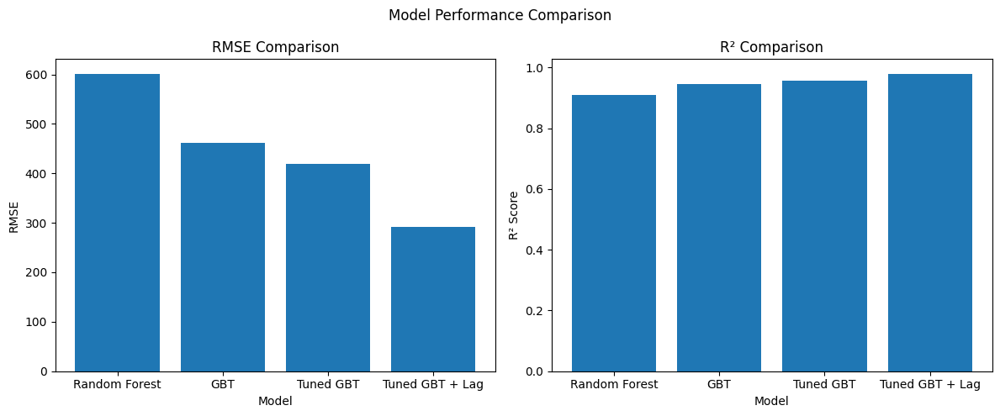

In [0]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 2, figsize=(12,5))

# RMSE plot
axes[0].bar(models, rmse_vals)
axes[0].set_title("RMSE Comparison")
axes[0].set_xlabel("Model")
axes[0].set_ylabel("RMSE")

# R² plot
axes[1].bar(models, r2_vals)
axes[1].set_title("R² Comparison")
axes[1].set_xlabel("Model")
axes[1].set_ylabel("R² Score")

plt.suptitle("Model Performance Comparison")
plt.tight_layout()
plt.show()



**Overall Conclusion**

This project focused on predicting traffic volume using machine learning models implemented in Apache Spark MLlib. Exploratory data analysis revealed strong temporal patterns in traffic behavior, with hour of day and day of week emerging as the most influential features, while weather variables showed a relatively weaker impact.

Based on these insights, Random Forest and Gradient-Boosted Trees (GBT) models were developed and evaluated using RMSE and R² metrics. The initial GBT model outperformed Random Forest, demonstrating a stronger ability to capture complex, non-linear relationships in traffic data. Further improvements were achieved through hyperparameter tuning using 5-fold cross-validation, resulting in a tuned GBT model with an RMSE of 419.51 and an R² of 0.95. Actual-vs-predicted and residual analyses confirmed improved prediction stability, particularly during high traffic periods.

To further enhance performance, lag features representing traffic volume from the previous hour and the same hour on the previous day were incorporated into the tuned GBT model. These features enabled the model to capture short-term trends and daily traffic repetition more effectively. The tuned GBT with lag features achieved a significantly improved RMSE of 291.41 and an R² of 0.978, indicating excellent predictive accuracy. Feature importance analysis confirmed that lag variables were among the most influential predictors.

Overall, the Tuned Gradient-Boosted Trees model with lag features proved to be the most effective approach for traffic volume prediction, combining strong temporal modeling capability with high accuracy. This makes it well suited for real-world traffic forecasting and transportation planning applications.